In [67]:
%matplotlib inline

# A Simple Introduction to Dynamic Programming

You are the librarian at the Bad Decisions School of Management, and you have hired several student assistants to help you burn all the books, because you are a very bad librarian.

You are also a lazy librarian, and want to knock off as early as possible, but you have to lock up after these blasted kids! You want the job to get done as quickly as possible, and so decide to divide the library as evenly as possible between the students, so that each student burns as closely as possible the same number of pages.

To ensure that the assistants don't collide in their travels, you also want to assign them continuous chunks of bookshelf, so that Assistant 1, for example, may get A through F, Assistant 2 may get G through S, and Assistant 3 might get T through Z.

Conveniently, you cannot be bothered to learn your assistants' names, and refer to them only by number, because you are also forgetful.

Luckily, you have Histoptimizer, a tool that would be utterly useless in any other situation, but is just the ticket here!

You load up the ol' Histoptimizer and feed it your catalog of books, sorted by shelf order:


In [68]:
import inspect
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import pandas as pd
import uuid
from math import pi, sin, cos

from histoptimizer import histoptimize, Histoptimizer

books = pd.read_csv('books.csv', header=0)
divisions = histoptimize(books, "Pages", [3], "assistant_", Histoptimizer)
divisions[0]

,Title,Pages,assistant_3
0,The Algorithm Design Manual,748,1
1,Software Engineering at Google,599,1
2,Site Reliability Engineering,550,1
3,Hands-on Machine Learning with Scikit-Learn Ke...,850,1
4,Clean Code,464,2
5,Code Complete,960,2
6,Web Operations,338,2
7,Consciousness Explained,528,2
8,I am a Strange Loop,432,2
9,The Information,544,3


Looking good! Histoptimizer returns a DataFrame where the 'assistant_3' column assigns each book to an assistant. Because they're in shelf order, Assistant 1 can start with the Algorithm Design Manual and work her way down the shelf to Hands-on Machine Learning. Assistant 2 can start with Clean Code, and so on.

But when we look at the number of pages for each assistant, it looks pretty lopsided!

In [69]:
import matplotlib.pyplot as plt

divisions[0].groupby('assistant_3').sum(numeric_only=True)
#divisions[0].groupby('assistant_3').sum(numeric_only=True).plot(kind="bar")

,Pages
assistant_3,
1,2747
2,2722
3,3080


Is this really the best we can do? Probably not, Histoptimizer is a buggy pile of crap! But how do we _prove_ it?

The only way to really know for sure is to compute the variance for every possible division of the books, and pick the lowest one.

First, we'll need a function that takes a list of items and dividers and returns the variance of the partition. We'll compare it to Histoptimizer's results to build a minimal sense of reliability about its correctness:


In [70]:
import numpy as np

def partition_variance(items: list, dividers: list, mean: float) -> float:
    variance = 0.0
    first_item = 0
    for d in np.concatenate([dividers, [len(items)]]):
        sum = 0.0
        for i in range(first_item, d):
            sum += items[i]
        variance += (mean-sum)**2
        first_item = d
    return variance/(len(dividers)+1)

dividers, variance = Histoptimizer.partition(books.Pages, 3)

print(f"Dividers: {dividers}\nHistoptimizer variance: {variance}\npartition_variance: "
      f"{partition_variance(books.Pages, dividers, books.Pages.sum() / 3)}")

Dividers: [4 9]
Histoptimizer variance: 26630.888020833332
partition_variance: 26630.888888888887


All right, good job us!

How do we know that we're testing every possible combination? One way is to look at every possible location for the first divider, and for each position, to examine every possible location of the second divider. If you had hired four assistants, then we would also need, for every possible position of the second divider, to check each possible position of the third, and so on.

That sounds like it lends itself to a recursive solution, and it does!

In [71]:
def partition_recursive(k: int, last_item: int, mean: float, items: list):
    """Recursively find a solution to the minimum variance linear partition problem.

    Takes:
        items: A list of item sizes
        k: Number of buckets to partition items into.
        last_item:
    """
    first_possible_position = k - 1
    best_cost = np.inf

    # The base case is that we are being called to find the optimum location of the first divider for a given
    # location of the second divider
    if k == 1:
        return (sum(items[0:last_item + 1]) - mean) ** 2, []

    for current_divider_location in range(first_possible_position,
                                          last_item + 1):
        (lh_cost, previous_dividers) = partition_recursive(k - 1,
                                                           current_divider_location - 1,
                                                           mean,
                                                           items)
        rh_cost = (sum(items[
                       current_divider_location:last_item + 1]) - mean) ** 2
        cost = lh_cost + rh_cost
        if cost < best_cost:
            best_cost = cost
            dividers = previous_dividers + [current_divider_location]
    return best_cost, dividers


def partition(items, num_buckets):
    msd, dividers = partition_recursive(num_buckets, len(items) - 1,
                                        sum(items) / num_buckets, items)
    return msd / num_buckets, dividers


In [72]:
partition(books.Pages, 3)

(26630.888888888887, [4, 9])

Okay yay good answer! Let's define a decorator that will collect the call graph, and then draw some pretty pictures.

In [73]:
class RecursiveCallGraph(object):

    def __init__(self, func):
        self.func = func
        self.calls = {}
        self.ordered_calls = []
        self.g = nx.DiGraph()
        self.callstack = []

    def __call__(self, *args, **kwargs):
        node_id = str(uuid.uuid1())
        parent_node_id = self.callstack[-1] if self.callstack else None
        self.callstack.append(node_id)
        self.g.add_node(node_id, args=args, kwargs=kwargs)
        # Don't add a node if it's not already in the graph.
        if self.g.has_node(parent_node_id):
            self.g.add_edge(parent_node_id, node_id)
            self.g.nodes[node_id].update(
                {'recursion_level': self.g.nodes[parent_node_id][
                                        'recursion_level']
                                    + 1})
        else:
            self.g.nodes[node_id].update({'recursion_level': 0})
        result = self.func(*args, **kwargs)
        self.g.nodes[node_id].update({'result': result})

        self.callstack.pop()
        return result

    def reset(self):
        self.calls = {}
        self.ordered_calls = []
        self.g = nx.DiGraph()
        self.callstack = []

In [74]:
partition_recursive = RecursiveCallGraph(partition_recursive)

Okay, now let's define a small function to draw that graph.

In [75]:
def get_child_node_dict(g):
    child_nodes = {n: set([]) for n in g.nodes}
    for n in g.nodes:
        s = set([x for x in g.neighbors(n)])
        child_nodes[n].update(s)
        while (s):
            new_s = set()
            for child in s:
                new_s.update(set([x for x in g.neighbors(child)]))
            s = new_s
            if len(s - child_nodes[n]) > 0:
                child_nodes[n].update(s)
            else:
                s = None
    return child_nodes


def arg_hash(a):
    return f"{a['args'][0]},{a['args'][1]}"


def get_call_count_dict(g):
    call_counts = {}
    for (node, a) in g.nodes.items():
        ah = arg_hash(a)
        call_counts[ah] = call_counts.get(ah, 0) + 1
    return call_counts


def get_labels_dict(g):
    return {n: f"K{a['args'][0]:2} "
               f"I{a['args'][1]:2}" for (n, a) in
            g.nodes.items()}


def get_sort_key_dict(g):
    # only works up to say 10 buckets and 999 items.
    return {n: a['args'][0]*1000 + a['args'][1] for (n, a) in
            g.nodes.items()}

def drunky_layout(g, all_child_nodes):
    layout = {list(g.nodes)[:1][0]: (0.0, 0.0)}
    level_one = [n for (n, a) in g.nodes.items() if a['recursion_level'] == 1]
    level_one_counts = {n: len(all_child_nodes[n]) for n in level_one}
    total_calls = sum(level_one_counts.values())
    base_range_radians = {}
    running_sum = 0

    for x in range(0, len(level_one)):
        n = level_one[x]
        base = running_sum / total_calls * pi * 2
        scale = level_one_counts[n] / total_calls * pi * 2
        running_sum += level_one_counts[n]
        base_range_radians[n] = (base, scale)

    for n in level_one:
        g.nodes[n]['l1_parent'] = n
        for child in all_child_nodes[n]:
            g.nodes[child]['l1_parent'] = n

    max_level = max([a['recursion_level'] for (n, a) in g.nodes.items()])
    ranges = None
    for l1node in level_one:
        base, scale = base_range_radians[l1node]
        parent_node_order = None
        for level in range(1, max_level + 1):
            nodes = [
                {
                    'node': n,
                    'sort_key': a['sort_key'],
                    'parent': a['parent'],
                    'num_children': len(g.edges(n))#len(all_child_nodes[n])
                }
                for (n, a) in g.nodes.items() if
                     a['recursion_level'] == level and a['l1_parent'] == l1node
            ]

            r = 6 / max_level * level

            if parent_node_order is not None:
                for x in range(0, len(nodes)):
                    nodes[x]['drunky_sort_key'] = (
                        parent_node_order[nodes[x]['parent']]*1000
                        + nodes[x]['sort_key']
                    )
                nodes.sort(key=lambda x: x['drunky_sort_key'])

                #margin = 1 * (1 - (level / max_level))
                margin = 0
                allocatable = scale - margin
                offset = (scale - allocatable) / 2
                children = sum([x['num_children'] for x in nodes])
                leaf_level = False
                if children != 0:
                    radians_per_child = allocatable / children
                else:
                    leaf_level = True
                running_base = 0.0
                for x in range(0, len(nodes)):
                    slice = nodes[x]['num_children']*radians_per_child
                    if not leaf_level:
                        radians = base + running_base + slice / 2
                    else:
                        radians = base + running_base + x * (allocatable / len(nodes))
                    running_base += slice
                    layout[nodes[x]['node']] = (cos(radians) * r, sin(radians) * r)
            else:
                # level 1
                radians = base + (scale / 2)
                layout[nodes[0]['node']] = (cos(radians) * r, sin(radians) * r)

            parent_node_order = {}
            for x in range(0, len(nodes)):
                parent_node_order[nodes[x]['node']] = x

    return layout



In [76]:
def hunky_layout(g, all_child_nodes):
    layout = {list(g.nodes)[:1][0]: (0.0, 0.0)}
    level_one = [n for (n, a) in g.nodes.items() if a['recursion_level'] == 1]

    for n in level_one:
        g.nodes[n]['l1_parent'] = n
        for child in all_child_nodes[n]:
            g.nodes[child]['l1_parent'] = n

    max_level = max([a['recursion_level'] for (n, a) in g.nodes.items()])

    if max_level == 0:
        layout = {n: (0,0) for n in g}
        return layout

    # Lay out the outer ring by sorting first on l1 parent, then on immediate parent,
    # and distribute nodes evenly
    nodes = [{'id': n,
              'leaf_sort_key': a.get('l1_parent', '') + a['parent']}
             for (n, a) in g.nodes.items() if a['recursion_level'] == max_level]
    nodes.sort(key=lambda x: x['leaf_sort_key'])
    theta_per = 2 * pi / len(nodes)
    theta = 0
    r = .6 * max_level
    for n in nodes:
        g.nodes[n['id']]['theta'] = theta
        layout[n['id']] = (cos(theta) * r, sin(theta) * r)
        theta = theta + theta_per

    # Now lay out all the other nodes at the midpoint of their children.
    for level in range(max_level - 1, 0, -1):
        r = 0.6 * level
        nodes = [
            {
                'node': n,
                'sort_key': a['sort_key'],
                'parent': a['parent'],
                'l1_parent': a['l1_parent'],
                'children': list([a[1] for a in g.edges(n)]),
            }
            for (n, a) in g.nodes.items() if
                 a['recursion_level'] == level
        ]
        for x in range(0, len(nodes)):
            r = 0.6 * level
            n = nodes[x]
            if n['children']:
                child_thetas = [g.nodes[a]['theta'] for a in n['children']]
                min_child_theta = min(child_thetas)
                max_child_theta = max(child_thetas)
                theta = min_child_theta + (max_child_theta - min_child_theta) / 2
            else:
                # interior leaf nodes we distribute to where they would go if
                # all sibling nodes were evenly distributed, then pull them in
                # a bit so they don't coincide with childed siblings. 🤷🏻‍♂️
                r = r - .25
                siblings = [a[1] for a in g.edges(n['parent'])]
                node_index = siblings.index(n['node'])
                min_l1_theta = min([a['theta'] for (v, a) in g.nodes.items() if a.get('l1_parent', None) == n['l1_parent'] and 'theta' in a])
                max_l1_theta = max([a['theta'] for (v, a) in g.nodes.items() if a.get('l1_parent', None) == n['l1_parent'] and 'theta' in a])
                dtheta = max_l1_theta - min_l1_theta
                theta = min_l1_theta + node_index*(dtheta/len(siblings))
            layout[n['node']] = (cos(theta) * r, sin(theta) * r)
            g.nodes[n['node']]['theta'] = theta

    return layout


In [77]:
def draw_call_graph(*args, layout=hunky_layout):
    for g in args:
        shells = []
        for x in range(0, max([v['recursion_level'] for (k, v) in
                               g.nodes.items()]) + 1):
            shells.append(
                [k for (k, v) in g.nodes.items() if v['recursion_level'] == x])

        call_counts = get_call_count_dict(g)
        all_child_nodes = get_child_node_dict(g)
        labels_dict = get_labels_dict(g)
        sort_keys = get_sort_key_dict(g)

        for n in labels_dict:
            g.nodes[n]['label'] = labels_dict[n]
            g.nodes[n]['sort_key'] = sort_keys[n]
            for from_node, to_node in g.edges(n):
                g.nodes[to_node].update({
                    'parent_label': labels_dict[n],
                    'parent_sort_key': sort_keys[n],
                    'parent': n
                })

        def color_map(count):
            return (0.0, min(1.0, 0.04 * count), 0.0)

        labels = {k: len(v) for (k, v) in all_child_nodes.items()}

        pos = layout(g, all_child_nodes)

        min_call_count = min(call_counts.values())
        max_call_count = max(call_counts.values())
        colors = [call_counts[arg_hash(a)] for (v, a) in g.nodes.items()]

        fig = plt.figure(figsize=(12, 12), dpi=400)
        nx.draw_networkx(g,
                         pos=pos,
                         with_labels=False,
                         font_color='white',
                         labels={n: a['label'] for (n, a) in g.nodes.items()},
                         node_size=20,
                         width=0.5,
                         arrowstyle='-',
                         edge_color='gray',
                         node_color=colors,
                         vmin=min_call_count,
                         vmax=max_call_count,
                         cmap="rainbow",
                         font_size=4)

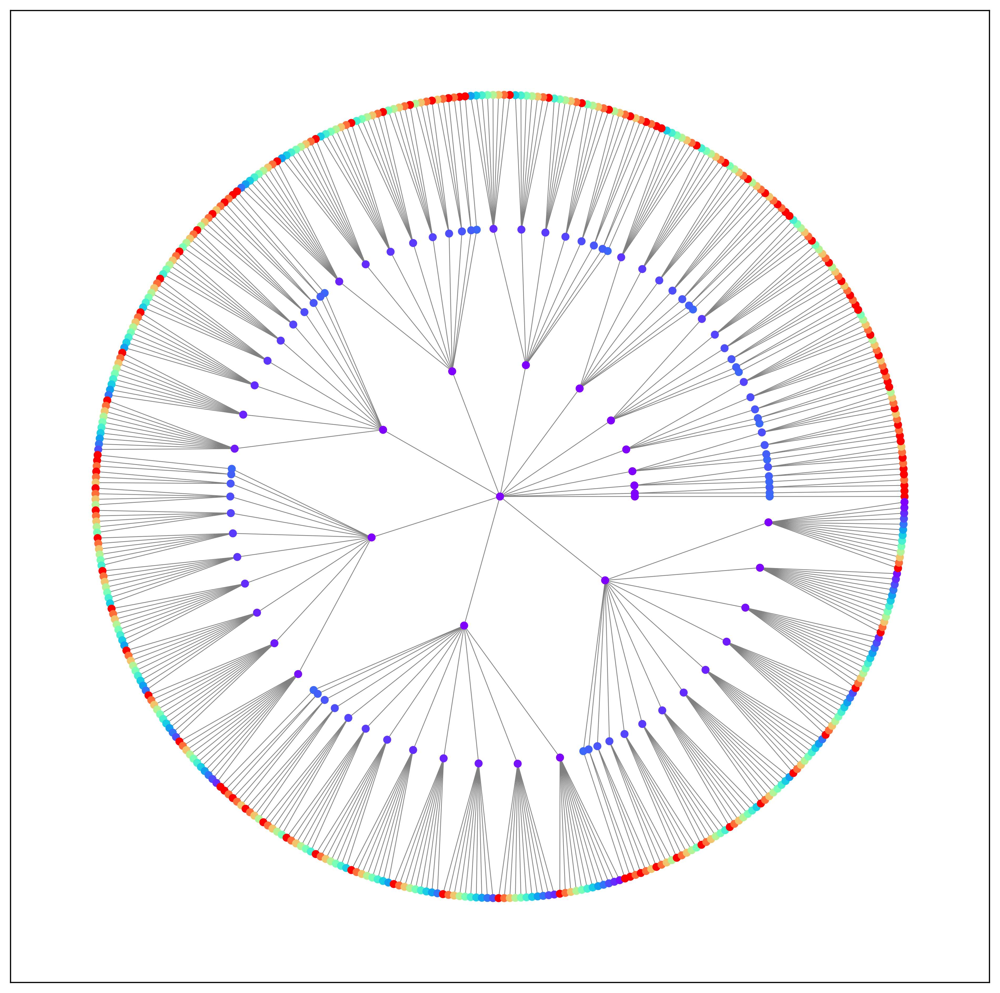

In [98]:
partition_recursive.reset()
v, d = partition(books.Pages, 4)
draw_call_graph(partition_recursive.g)


But the number of recursive calls goes up quickly. We need a very strong term for this. I'm going to call it...an eruption of combinations.

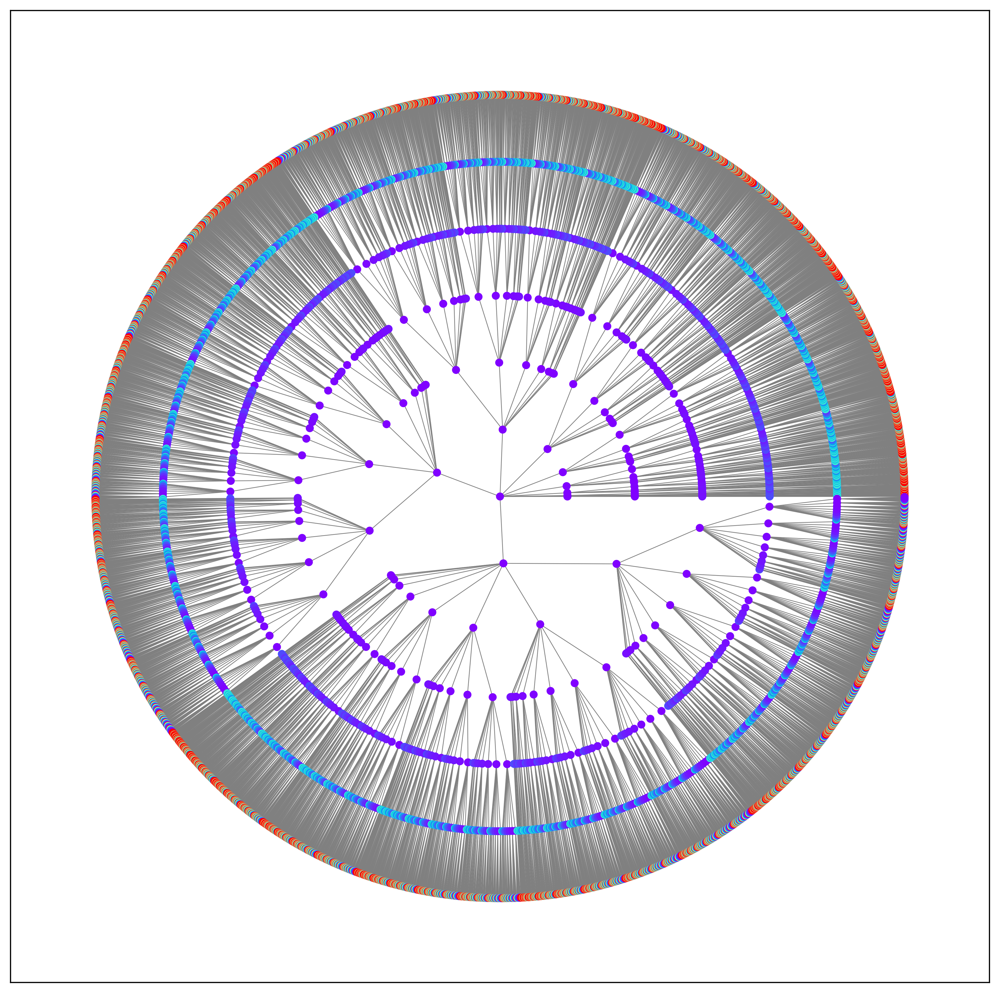

In [79]:
partition_recursive.reset()
v, d = partition(books.Pages, 7)
draw_call_graph(partition_recursive.g)

Okay now let's add a cache.

In [80]:
@RecursiveCallGraph
def recursive_cache_partition(k: int, last_item: int, mean: float, items: list,
                              cache: dict):
    # Return cache hit if there is one.
    if cache.get(k, None) is None:
        cache[k] = {}
    cached_value = cache[k].get(last_item, None)
    if cached_value is not None:
        return cache[k][last_item]

    n = len(items)
    j = k - 1
    if mean is None:
        mean = sum(items) / k
    if last_item is None:
        last_item = n - 1
    first_possible_position = j
    best_cost = np.inf

    # The base case is that we are being called to find the optimum location of the first divider for a given
    # location of the second divider
    if k == 0:
        return (sum(items[0:last_item + 1]) - mean) ** 2, []

    for current_divider_location in range(first_possible_position,
                                          last_item + 1):
        (lh_cost, previous_dividers) = recursive_cache_partition(k - 1,
                                                                 current_divider_location - 1,
                                                                 mean,
                                                                 items,
                                                                 cache)
        rh_cost = (sum(items[
                       current_divider_location:last_item + 1]) - mean) ** 2
        cost = lh_cost + rh_cost
        if cost < best_cost:
            best_cost = cost
            dividers = previous_dividers + [current_divider_location]

    cache[k][last_item] = (best_cost, dividers)
    return best_cost, dividers


def cache_partition(items, k):
    cache = {}
    variance, dividers = recursive_cache_partition(k, len(items) - 1,
                                                   sum(items) / k,
                                                   items, cache)
    return dividers, variance / k


In [99]:
recursive_cache_partition.reset()
v, d = cache_partition(books.Pages, 7)

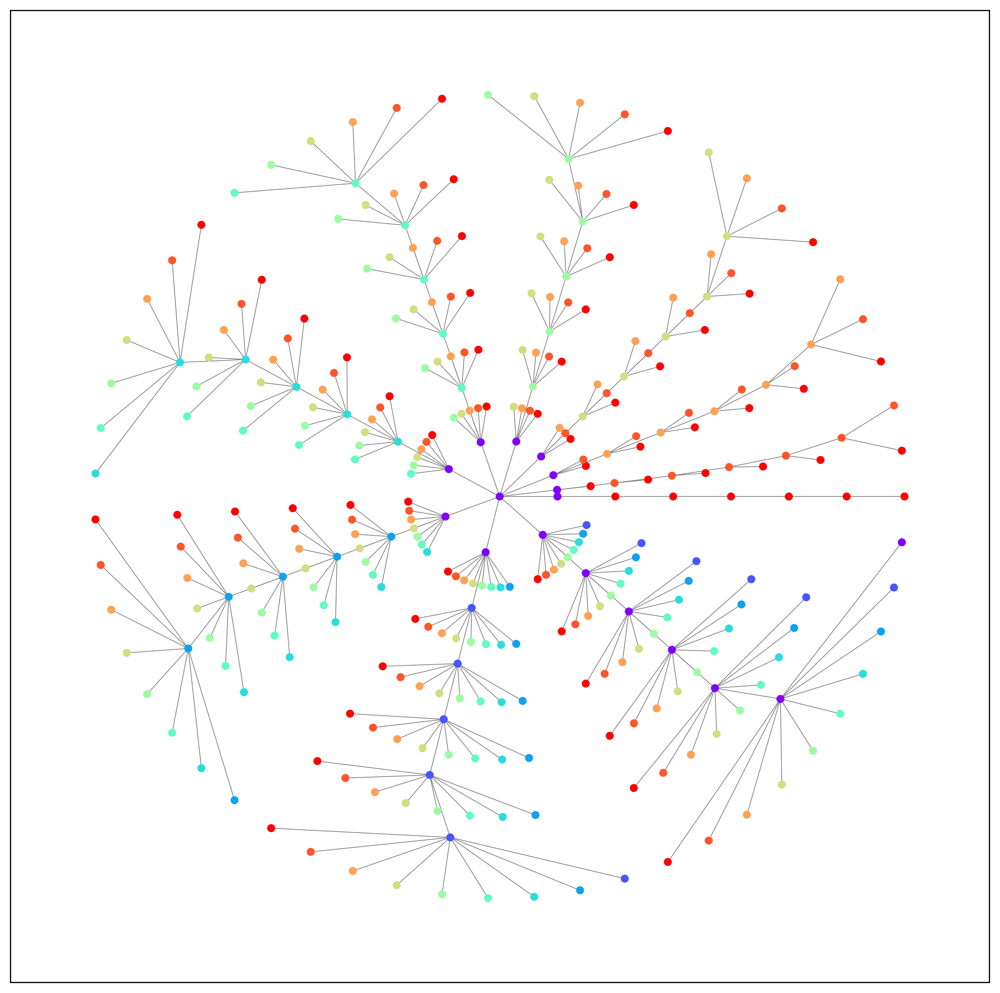

In [100]:
draw_call_graph(recursive_cache_partition.g)

Pretty good, this contains many fewer calls. Let's try eliminating a few more of them.

In [83]:
@RecursiveCallGraph
def recursive_cache_partition_2(k: int, last_item: int, mean: float,
                                items: list,
                                cache: dict):
    # Return cache hit if there is one.
    if cache is None:
        cache = {}
    if cache.get(k, None) is None:
        cache[k] = {}
    cached_value = cache[k].get(last_item, None)
    if cached_value is not None:
        return cache[k][last_item]

    n = len(items)
    j = k - 1
    if mean is None:
        mean = sum(items) / k
    if last_item is None:
        last_item = n - 1
    first_possible_position = j
    best_cost = np.inf

    # The base case is that we are being called to find the optimum location of the first divider for a given
    # location of the second divider
    if j == 0:
        return (sum(items[0:last_item + 1]) - mean) ** 2, []

    for current_divider_location in range(first_possible_position,
                                          last_item + 1):
        if k - 1 in cache and (current_divider_location - 1) in cache[k - 1]:
            (lh_cost, previous_dividers) = cache[k - 1][
                current_divider_location - 1]
        else:
            (lh_cost, previous_dividers) = recursive_cache_partition_2(k - 1,
                                                                       current_divider_location - 1,
                                                                       mean,
                                                                       items,
                                                                       cache)
        rh_cost = (sum(items[
                       current_divider_location:last_item + 1]) - mean) ** 2
        cost = lh_cost + rh_cost
        if cost < best_cost:
            best_cost = cost
            dividers = previous_dividers + [current_divider_location]

    cache[k][last_item] = (best_cost, dividers)
    return best_cost, dividers


def cache_partition_2(items, k):
    cache = {}
    variance, dividers = recursive_cache_partition_2(k, len(items) - 1,
                                                     sum(items) / k,
                                                     items, cache)
    return dividers, variance / k


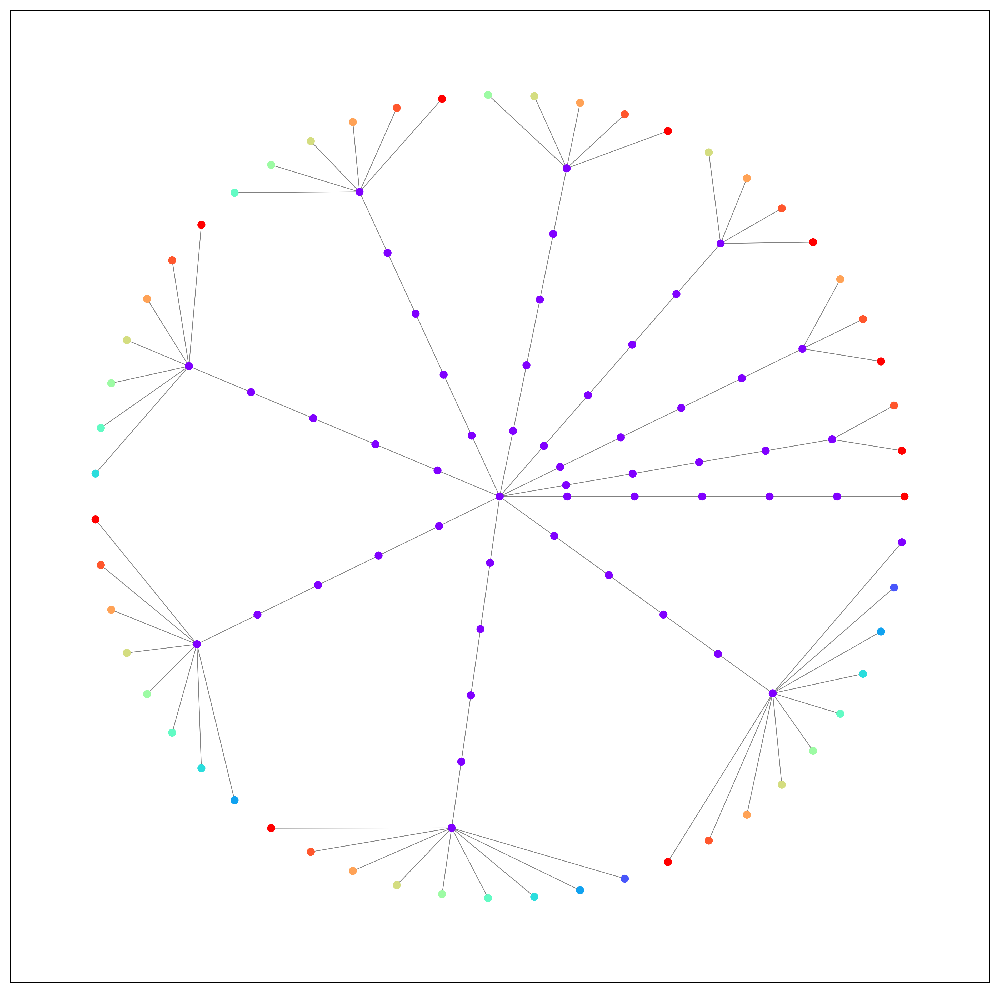

In [101]:
recursive_cache_partition_2.reset()
cache_partition_2(books.Pages, 7)
draw_call_graph(recursive_cache_partition_2.g)

Doing pretty good but let's eliminate the base case so we don't have any repetitive calls.

In [92]:
@RecursiveCallGraph
def recursive_cache_partition_3(k: int, last_item: int, mean: float,
                                items: list,
                                cache: dict):
    n = len(items)
    if mean is None:
        mean = sum(items) / k
    if last_item is None:
        last_item = n - 1
    first_possible_position = k - 1
    best_cost = np.inf

    # The base case remains broken out. These could be integrated into the main loop and any
    # calls
    if k == 1:
        if 1 not in cache:
            cache[1] = {}
        if last_item not in cache[1]:
            (lh_cost, previous_dividers) = (sum(items[0:last_item + 1]) - mean) ** 2, []
            cache[1][last_item] = (lh_cost, previous_dividers)
            return lh_cost, previous_dividers

    for current_divider_location in range(first_possible_position,
                                          last_item + 1):
        if k - 1 in cache and (current_divider_location - 1) in cache[k - 1]:
            (lh_cost, previous_dividers) = cache[k - 1][
                current_divider_location - 1]
        else:
            (lh_cost, previous_dividers) = recursive_cache_partition_3(k - 1,
                                                                       current_divider_location - 1,
                                                                       mean,
                                                                       items,
                                                                       cache)
        rh_cost = (sum(items[
                       current_divider_location:last_item + 1]) - mean) ** 2
        cost = lh_cost + rh_cost
        if cost < best_cost:
            best_cost = cost
            dividers = previous_dividers + [current_divider_location]

    if k not in cache:
        cache[k] = {}
    cache[k][last_item] = (best_cost, dividers)
    return best_cost, dividers


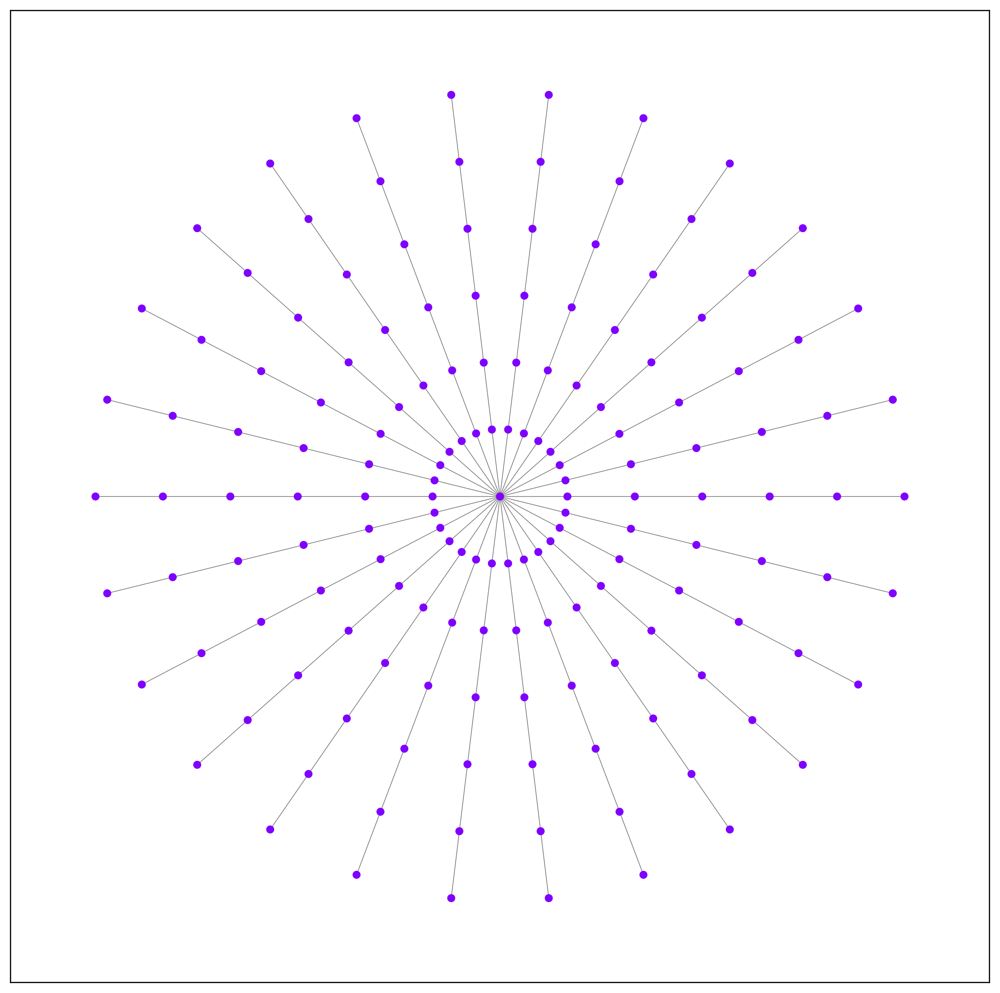

In [102]:
recursive_cache_partition_3.reset()
pages = list(books.Pages) + list(books.Pages)
v, d = cache_partition_3(pages, 7)
draw_call_graph(recursive_cache_partition_3.g)

Pretty cool, we got rid of every redundant call. Now let's define a layout that positions nodes in the y axis according to the last_item value and the x axis according to the bucket value.

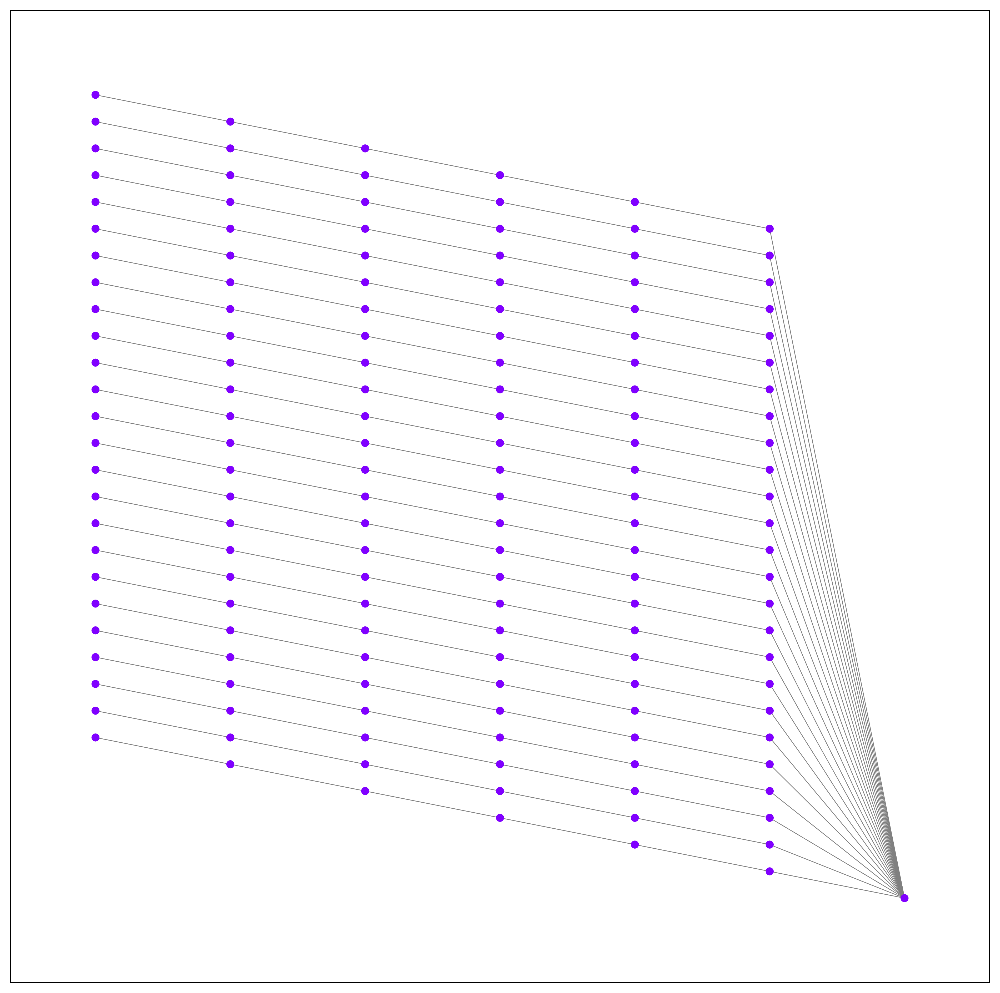

In [89]:
def grid_layout(g, all_child_nodes):
    max_buckets = max([a['args'][0] for (n, a) in g.nodes.items()])
    max_items = max([a['args'][1] for (n, a) in g.nodes.items()])
    return {
        n: (a['args'][0]*6/max_buckets, 6-a['args'][1]*6/max_items)
        for (n, a) in g.nodes.items()
    }

draw_call_graph(recursive_cache_partition_3.g, layout=grid_layout)

Well look at that why doncha, turns out the recursive calls form a grid of parameter values. If we can just fill in that grid, we won't have to do any recursion at all. And that's dynamic programming.